# Спортивный анализ данных. Платформа Kaggle. Домашнее задание №2

В домашнем задании, будем обучать разные алгоритмы машинного обучения. Для этого, нужно предварительно зафиксировать схему валидации решения (можете выбрать любую, которую знаете). Выбранную схему валидации нужно использовать во всех задачах этого домашнего задания. Метрика качества - ROC AUC, целевая переменная - isFraud.

Ссылка на данные - https://drive.google.com/file/d/1gMEVl47pIoV1-AseB9doQ6DZNJrY3NkW/view?usp=sharing

## Загрузим и поисследуем датасет

In [1]:
from typing import List, Optional
from tqdm import tqdm

import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt

import seaborn as sns
import scipy.stats as st
from scipy.stats import probplot, ks_2samp

from sklearn.metrics import roc_auc_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold, cross_val_score
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.utils.validation import check_is_fitted
import missingno as msno
import xgboost as xgb
%matplotlib inline

from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import OneHotEncoder
import lightgbm as lgb
!pip install catboost
import catboost as cb

     |████████████████████████████████| 65.7MB 43kB/s 


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Загрузка датасета и вывод размерностей

In [3]:
train = pd.read_csv("/content/drive/MyDrive/assignment_2_train.csv")
test = pd.read_csv("/content/drive/MyDrive/assignment_2_test.csv")

print("train.shape = {} rows, {} cols".format(*train.shape))
print("test.shape = {} rows, {} cols".format(*test.shape))

train.shape = 180000 rows, 394 cols
test.shape = 100001 rows, 394 cols


Вывод базовых статистик

In [4]:
train.describe()

,TransactionID,isFraud,TransactionDT,TransactionAmt,card1,card2,card3,card5,addr1,addr2,dist1,dist2,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,...,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
count,1.800000e+05,180000.000000,1.800000e+05,180000.000000,180000.000000,177389.000000,179997.000000,179047.000000,160567.000000,160567.000000,60605.000000,14458.000000,180000.000000,180000.000000,180000.000000,180000.000000,180000.000000,180000.000000,180000.000000,180000.000000,180000.000000,180000.000000,180000.000000,180000.000000,180000.000000,180000.000000,180000.000000,80302.00000,83038.000000,106927.000000,68756.00000,24236.000000,11676.000000,33596.000000,33596.000000,134335.000000,59099.000000,20804.000000,18667.000000,20544.000000,...,180000.000000,180000.000000,179989.000000,179989.000000,179989.000000,179989.000000,179989.000000,179989.000000,179989.000000,179989.000000,179989.000000,179989.000000,179989.000000,180000.000000,180000.000000,180000.000000,179989.000000,179989.000000,179989.000000,179989.000000,179989.000000,179989.000000,47996.000000,47996.000000,47996.000000,47996.000000,47996.000000,47996.000000,47996.000000,47996.000000,47996.000000,47996.000000,47996.000000,47996.000000,47996.000000,47996.000000,47996.000000,47996.000000,47996.000000,47996.000000
mean,3.077000e+06,0.028561,1.909818e+06,129.514237,9860.225806,368.326897,153.410374,200.363089,291.160444,86.559903,126.243231,240.962443,25.777433,29.350017,0.008550,10.855600,4.477589,15.097289,8.683144,14.589533,3.569739,14.908167,18.678239,12.173150,36.227056,11.860606,77.436922,164.34826,28.970339,127.049118,41.47814,58.011182,51.794365,164.652675,0.570552,114.354733,120.285470,44.196068,15.830985,43.549065,...,0.047789,0.051611,0.372178,0.393546,0.380140,1.000011,49.396154,216.779557,97.907668,9.237262,89.451569,3.769967,30.054221,17.108003,33.913428,21.298733,25.697547,102.237874,49.712299,13.856681,24.361312,17.463409,0.329382,0.613030,0.427098,0.042274,0.237395,0.098904,0.124260,0.166618,0.137074,74.962242,99.220468,85.778161,8.326725,18.404676,12.437524,26.798593,32.005349,28.492421
std,5.196167e+04,0.166570,1.039029e+06,206.515032,4910.778205,158.952840,11.529483,40.585532,102.250385,3.958070,386.295086,547.819624,231.541284,269.566056,0.149701,117.592313,22.618505,118.906371,111.500096,170.888622,15.049897,171.444856,162.243821,156.469341,174.882350,78.590764,139.629932,163.67447,61.684368,172.266946,83.83650,130.129375,110.997400,245.868172,0.313308,165.799738,158.975322,107.269102,66.230610,117.793242,...,0.321222,0.333971,0.518501,0.594913,0.539449,0.003333,420.613508,1645.154698,638.946187,68.893660,263.343812,48.078587,119.833928,85.605977,151.509087,100.410411,223.057788,1496.642621,488.273749,310.484432,339.055025,319.096752,1.178282,2.647746,1.454780,0.246286,1.859281,0.591771,0.589255,0.913290,0.642444,545.161980,668.223140,577.072150,84.616132,120.896921,99.305885,252.695682,284.870583,258.372941
min,2.987000e+06,0.000000,8.640000e+04,0.292000,1001.000000,100.000000,100.000000,100.000000,100.000000,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,-122.000000,0.00000,-83.000000,0.000000,0.000000,0.000000,0.000000,-33.000000,-83.000000,0.000000,-193.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.032000e+06,0.000000,1.091681e+06,44.000000,6019.000000,215.000000,150.000000,166.000000,204.0000

In [5]:
test.describe()

,TransactionID,isFraud,TransactionDT,TransactionAmt,card1,card2,card3,card5,addr1,addr2,dist1,dist2,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,...,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
count,1.000010e+05,100001.000000,1.000010e+05,100001.000000,100001.000000,98325.000000,99185.000000,98701.000000,88300.000000,88300.000000,39103.000000,4360.000000,100001.000000,100001.000000,100001.000000,100001.000000,100001.000000,100001.000000,100001.000000,100001.000000,100001.000000,100001.000000,100001.000000,100001.000000,100001.000000,100001.000000,99732.000000,53475.000000,57535.000000,79300.00000,51368.000000,11065.000000,6062.000000,9458.000000,9458.000000,93964.000000,66962.000000,10316.000000,10716.000000,10299.000000,...,99732.000000,99732.000000,100001.000000,100001.000000,100001.000000,100001.0,100001.000000,100001.000000,100001.000000,100001.000000,100001.000000,100001.000000,100001.000000,99732.000000,99732.000000,99732.000000,100001.000000,100001.000000,100001.000000,100001.000000,100001.000000,100001.000000,6774.000000,6774.000000,6774.000000,6774.000000,6774.000000,6774.000000,6774.000000,6774.000000,6774.000000,6774.000000,6774.000000,6774.000000,6774.000000,6774.000000,6774.000000,6774.000000,6774.000000,6774.000000
mean,3.337000e+06,0.038040,8.696663e+06,140.674821,9882.200528,357.652672,153.271785,198.466672,289.507758,86.863941,104.271386,235.587615,8.279797,8.222968,0.003690,0.651513,6.056549,5.946601,0.244288,0.686413,4.790442,0.711613,6.016320,0.447686,29.593744,6.455335,94.306983,165.236971,29.161745,132.77517,43.627453,69.694442,39.559221,125.557385,0.544697,114.221649,137.867686,59.804963,19.829507,53.252646,...,0.043757,0.052230,0.183058,0.210938,0.192898,1.0,48.877726,241.794153,103.815527,12.446817,121.980028,4.701370,42.273046,24.150363,45.612901,30.718740,20.610689,90.901028,40.923873,15.612109,28.682812,20.397278,0.405669,1.282403,0.637437,0.035872,0.762622,0.206082,0.168881,0.242545,0.192944,81.733429,123.824365,91.572815,6.744021,36.245940,11.969737,47.597468,52.675413,48.497675
std,2.886795e+04,0.191293,7.603909e+05,240.272633,4867.290775,156.984512,11.512903,41.495035,101.589641,2.143002,342.377797,581.269021,35.161531,36.349635,0.159111,16.933688,27.014512,25.633511,2.223536,9.852489,16.840890,9.083298,26.370039,4.119370,101.050089,24.472343,158.798907,178.634878,64.847379,188.96681,92.424505,145.454726,97.147515,209.509607,0.325800,179.222515,181.842617,130.682134,71.340378,131.274497,...,0.262021,0.295744,0.420202,0.569056,0.458835,0.0,318.423256,1510.828700,549.612646,102.276379,354.206073,76.518535,171.184696,101.663324,169.630670,127.638746,196.938556,1380.593926,431.777948,197.011698,236.021642,210.136843,0.978676,3.545839,1.398336,0.201970,3.180813,0.876579,0.556401,0.739561,0.606917,715.898781,777.526194,718.203590,214.832591,269.734936,216.315923,597.985868,600.451426,598.024560
min,3.287000e+06,0.000000,7.415038e+06,0.251000,1004.000000,100.000000,100.000000,100.000000,104.000000,16.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-53.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.312000e+06,0.000000,8.023328e+06,44.529000,6019.000000,206.000000,150.000000,166.000000,204.000000,87.000000,3.000000,7.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1

In [6]:
train.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,...,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,credit,315.0,87.0,19.0,NaN,NaN,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,debit,330.0,87.0,287.0,NaN,outlook.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,debit,476.0,87.0,NaN,NaN,yahoo.com,NaN,2.0,5.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.0,1.0,112.0,112.0,0.0,94.0,0.0,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,50.0,1758.0,925.0,0.0,354.0,0.0,135.0,0.0,0.0,0.0,50.0,1404.0,790.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,credit,420.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [7]:
test.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,...,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,3287000,1,7415038,226.00,W,12473,555.0,150.0,visa,226.0,credit,299.0,87.0,116.0,NaN,aol.com,NaN,2.0,3.0,0.0,0.0,0.0,5.0,0.0,0.0,3.0,0.0,3.0,2.0,6.0,2.0,4.0,4.0,0.0,4.0,3.0,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,452.000000,2924.000000,2924.000000,0.0,412.0,0.0,412.0,206.0,412.0,412.0,452.0,2512.0,2512.0,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3287001,0,7415054,3072.00,W,15651,417.0,150.0,visa,226.0,debit,330.0,87.0,NaN,NaN,yahoo.com,NaN,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,0.0,0.0,0.0,NaN,NaN,NaN,NaN,...,1.0,1.0,0.0,0.0,0.0,1.0,3059.949951,3059.949951,3059.949951,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3059.949951,3059.949951,3059.949951,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3287002,0,7415081,319.95,W,13844,583.0,150.0,visa,226.0,credit,126.0,87.0,9.0,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,0.0,0.0,0.0,NaN,NaN,NaN,NaN,...,1.0,1.0,0.0,0.0,0.0,1.0,319.950012,319.950012,319.950012,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,319.950012,319.950012,319.950012,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3287003,0,7415111,171.00,W,11556,309.0,150.0,visa,226.0,debit,181.0,87.0,3.0,NaN,anonymous.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,2.0,1.0,6.0,6.0,6.0,6.0,6.0,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,59.000000,59.000000,0.0,59.0,0.0,59.0,59.0,59.0,59.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,3287004,0,7415112,107.95,W,10985,555.0,150.0,visa,226.0,debit,231.0,87.0,0.0,NaN,anonymous.com,NaN,2.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,2.0,0.0,1.0,0.0,10.0,2.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(0.0, 394.0)

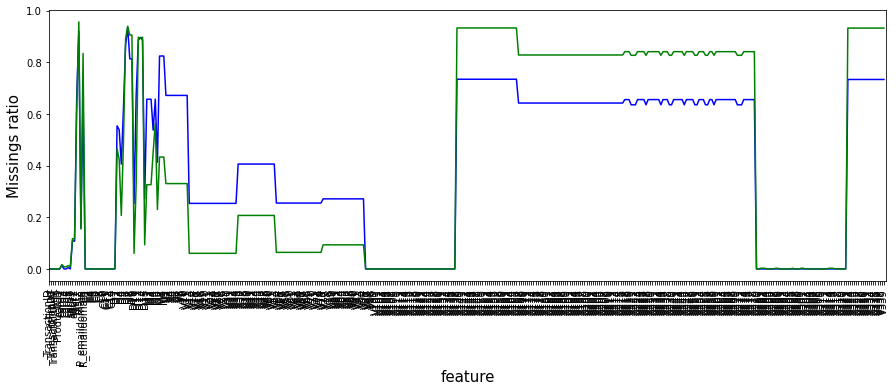

In [8]:
fig = plt.figure(figsize=(15, 5))
plt.plot(train.isnull().mean(), label="train", color="blue")
plt.plot(test.isnull().mean(), label="test", color="green")
plt.xticks(range(train.shape[1]), train.columns, rotation=90)
plt.ylabel("Missings ratio", size=15)
plt.xlabel("feature", size=15)
plt.xlim(0, train.shape[1])

Вывод: имеем большое количество пропущенных значений

Подсчитаем количество числовых признаков

In [10]:
train.shape

(180000, 394)

In [9]:
numerical_features = train.select_dtypes(include=[np.number])
print(f"count of numeric_features {numerical_features.shape[1]}")

numerical_features.columns

count of numeric_features 380


Index(['TransactionID', 'isFraud', 'TransactionDT', 'TransactionAmt', 'card1',
       'card2', 'card3', 'card5', 'addr1', 'addr2',
       ...
       'V330', 'V331', 'V332', 'V333', 'V334', 'V335', 'V336', 'V337', 'V338',
       'V339'],
      dtype='object', length=380)

Вывод: 380 из 394 признаков являются числовыми

Проверим наличие категориальных признаков

In [15]:
categorical_features = train.select_dtypes(include=[np.object])
print(f"Categorical Feature Count {categorical_features.shape[1]}")
categorical_features

Categorical Feature Count 14


,ProductCD,card4,card6,P_emaildomain,R_emaildomain,M1,M2,M3,M4,M5,M6,M7,M8,M9
0,W,discover,credit,NaN,NaN,T,T,T,M2,F,T,NaN,NaN,NaN
1,W,mastercard,credit,gmail.com,NaN,NaN,NaN,NaN,M0,T,T,NaN,NaN,NaN
2,W,visa,debit,outlook.com,NaN,T,T,T,M0,F,F,F,F,F
3,W,mastercard,debit,yahoo.com,NaN,NaN,NaN,NaN,M0,T,F,NaN,NaN,NaN
4,H,mastercard,credit,gmail.com,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
179995,W,mastercard,debit,gmail.com,NaN,T,T,F,M1,T,F,NaN,NaN,NaN
179996,W,mastercard,debit,yahoo.com,NaN,NaN,NaN,NaN,NaN,NaN,T,NaN,NaN,NaN
179997,W,mastercard,debit,gmail.com,NaN,T,T,T,M0,T,F,NaN,NaN,NaN
179998,W,visa,debit,NaN,NaN,NaN,NaN,NaN,M1,T,T,NaN,NaN,NaN


Вывод: имеем 14 категориальных признаков

## 1. Задание 1: отобрать только числовые признаки и обучить модель XGBoost с параметром booster = gbtree. Обучать алгоритм до тех пор, пока метрика качества не перестанет улучшаться на валидационной выборке в течение определенного числа итераций (выбрать значение самостоятельно).

In [16]:
numerical_features = train.select_dtypes(include=[np.number])
print(f"count of numeric_features {numerical_features.shape[1]}")

numerical_features.columns

count of numeric_features 380


Index(['TransactionID', 'isFraud', 'TransactionDT', 'TransactionAmt', 'card1',
       'card2', 'card3', 'card5', 'addr1', 'addr2',
       ...
       'V330', 'V331', 'V332', 'V333', 'V334', 'V335', 'V336', 'V337', 'V338',
       'V339'],
      dtype='object', length=380)

In [17]:
target = numerical_features['isFraud']
numerical_features.drop(columns=['isFraud'], inplace=True)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [45]:
params = {
    "booster": "gbtree",
    "objective": "binary:logistic",
    "eval_metric": "auc",
    "learning_rate": 0.1,
    "n_estimators": 1000,
    "reg_lambda": 100,
    "max_depth": 4,
    "gamma": 10,
    "nthread": -1,
    "seed": 27,
    'tree_method': 'gpu_hist'
}

In [46]:
dtrain = xgb.DMatrix(
    data=numerical_features, label=target
)

In [47]:
cv_result_xgb_num = xgb.cv(
    params=params,
    dtrain=dtrain,
    num_boost_round=10000,
    early_stopping_rounds=25,
    verbose_eval=25,
    stratified=True,
    seed=42,
    metrics="auc",
    maximize=True,
    shuffle=True,
    nfold=3
)

[0]	train-auc:0.640289+0.0145493	test-auc:0.637571+0.0119255
[25]	train-auc:0.841497+0.00158368	test-auc:0.83958+0.00259234
[50]	train-auc:0.883221+0.000969145	test-auc:0.877425+0.00277682
[75]	train-auc:0.896182+0.000454711	test-auc:0.887764+0.00266147
[100]	train-auc:0.903405+0.00109896	test-auc:0.893266+0.00244913
[125]	train-auc:0.908834+0.000913428	test-auc:0.897068+0.00248055
[150]	train-auc:0.913232+0.00110269	test-auc:0.90023+0.00230576
[175]	train-auc:0.917013+0.00123189	test-auc:0.903247+0.00252356
[200]	train-auc:0.919895+0.00122013	test-auc:0.9054+0.00255159
[225]	train-auc:0.922321+0.000946485	test-auc:0.907089+0.00237355
[250]	train-auc:0.924621+0.000713085	test-auc:0.908721+0.00220088
[275]	train-auc:0.926541+0.000578452	test-auc:0.910095+0.00200295
[300]	train-auc:0.928493+0.000740024	test-auc:0.911303+0.00197097
[325]	train-auc:0.929956+0.000853701	test-auc:0.91235+0.00221255
[350]	train-auc:0.931511+0.000660945	test-auc:0.91323+0.00200609
[375]	train-auc:0.932828+0.00

In [48]:
cv_result_xgb_num.tail(3)

,train-auc-mean,train-auc-std,test-auc-mean,test-auc-std
2545,0.977207,0.000463,0.938535,0.001754
2546,0.977220,0.000459,0.938543,0.001751
2547,0.977232,0.000452,0.938549,0.001752


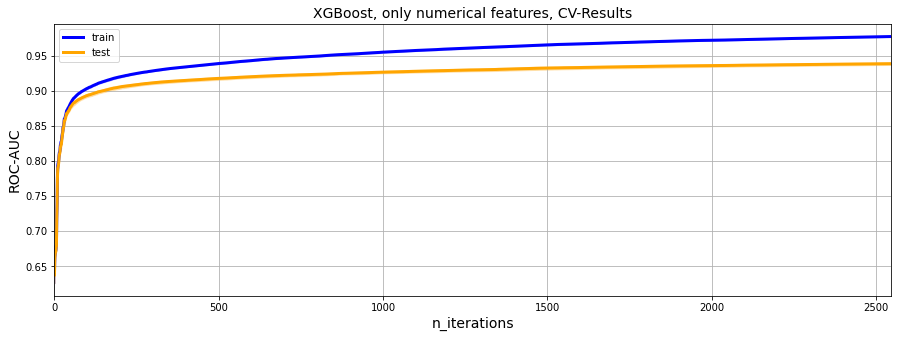

In [49]:
fig = plt.figure(figsize=(15, 5))
plt.plot(cv_result_xgb_num["train-auc-mean"], color="blue", linewidth=3, label="train")
plt.plot(cv_result_xgb_num["test-auc-mean"], color="orange", linewidth=3, label="test")
plt.fill_between(
    x=cv_result_xgb_num.index,
    y1=cv_result_xgb_num["train-auc-mean"] - cv_result_xgb_num["train-auc-std"],
    y2=cv_result_xgb_num["train-auc-mean"] + cv_result_xgb_num["train-auc-std"],
    alpha=0.25, color="blue"
)
plt.fill_between(
    x=cv_result_xgb_num.index,
    y1=cv_result_xgb_num["test-auc-mean"] - cv_result_xgb_num["test-auc-std"],
    y2=cv_result_xgb_num["test-auc-mean"] + cv_result_xgb_num["test-auc-std"],
    alpha=0.25, color="orange"
)
plt.title("XGBoost, only numerical features, CV-Results", size=14)
plt.xlabel("n_iterations", size=14)
plt.xlim(0, cv_result_xgb_num.index.max())
plt.ylabel("ROC-AUC", size=14)
plt.legend(loc="best")
plt.grid()

## 2. Задание 2: обработать категориальные признаки любым способом (который вы знаете) и добавить их к данным. Выполнить задание 1.

In [50]:
numerical_features.head(3)

,TransactionID,TransactionDT,TransactionAmt,card1,card2,card3,card5,addr1,addr2,dist1,dist2,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,...,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,2987000,86400,68.5,13926,NaN,150.0,142.0,315.0,87.0,19.0,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,86401,29.0,2755,404.0,150.0,102.0,325.0,87.0,NaN,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,86469,59.0,4663,490.0,150.0,166.0,330.0,87.0,287.0,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,315.0,NaN,NaN,NaN,315.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [51]:
categorical_features.head(3)

,ProductCD,card4,card6,P_emaildomain,R_emaildomain,M1,M2,M3,M4,M5,M6,M7,M8,M9
0,W,discover,credit,NaN,NaN,T,T,T,M2,F,T,NaN,NaN,NaN
1,W,mastercard,credit,gmail.com,NaN,NaN,NaN,NaN,M0,T,T,NaN,NaN,NaN
2,W,visa,debit,outlook.com,NaN,T,T,T,M0,F,F,F,F,F


In [52]:
one_hot_features = pd.get_dummies(categorical_features)

In [53]:
one_hot_features.head(3)

,ProductCD_C,ProductCD_H,ProductCD_R,ProductCD_S,ProductCD_W,card4_american express,card4_discover,card4_mastercard,card4_visa,card6_charge card,card6_credit,card6_debit,card6_debit or credit,P_emaildomain_aim.com,P_emaildomain_anonymous.com,P_emaildomain_aol.com,P_emaildomain_att.net,P_emaildomain_bellsouth.net,P_emaildomain_cableone.net,P_emaildomain_centurylink.net,P_emaildomain_cfl.rr.com,P_emaildomain_charter.net,P_emaildomain_comcast.net,P_emaildomain_cox.net,P_emaildomain_earthlink.net,P_emaildomain_embarqmail.com,P_emaildomain_frontier.com,P_emaildomain_frontiernet.net,P_emaildomain_gmail,P_emaildomain_gmail.com,P_emaildomain_gmx.de,P_emaildomain_hotmail.co.uk,P_emaildomain_hotmail.com,P_emaildomain_hotmail.de,P_emaildomain_hotmail.es,P_emaildomain_hotmail.fr,P_emaildomain_icloud.com,P_emaildomain_juno.com,P_emaildomain_live.com,P_emaildomain_live.com.mx,...,R_emaildomain_ptd.net,R_emaildomain_q.com,R_emaildomain_roadrunner.com,R_emaildomain_rocketmail.com,R_emaildomain_sbcglobal.net,R_emaildomain_sc.rr.com,R_emaildomain_scranton.edu,R_emaildomain_servicios-ta.com,R_emaildomain_suddenlink.net,R_emaildomain_twc.com,R_emaildomain_verizon.net,R_emaildomain_web.de,R_emaildomain_windstream.net,R_emaildomain_yahoo.co.jp,R_emaildomain_yahoo.co.uk,R_emaildomain_yahoo.com,R_emaildomain_yahoo.com.mx,R_emaildomain_yahoo.de,R_emaildomain_yahoo.es,R_emaildomain_yahoo.fr,R_emaildomain_ymail.com,M1_F,M1_T,M2_F,M2_T,M3_F,M3_T,M4_M0,M4_M1,M4_M2,M5_F,M5_T,M6_F,M6_T,M7_F,M7_T,M8_F,M8_T,M9_F,M9_T
0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,1,1,0,0,1,0,0,0,0,0,0
1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0
2,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,1,0,0,1,0,1,0,1,0,1,0,1,0


In [54]:
numerical_one_hot_features = pd.concat([numerical_features, one_hot_features], axis=1)

In [55]:
numerical_one_hot_features.head()

,TransactionID,TransactionDT,TransactionAmt,card1,card2,card3,card5,addr1,addr2,dist1,dist2,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,...,R_emaildomain_ptd.net,R_emaildomain_q.com,R_emaildomain_roadrunner.com,R_emaildomain_rocketmail.com,R_emaildomain_sbcglobal.net,R_emaildomain_sc.rr.com,R_emaildomain_scranton.edu,R_emaildomain_servicios-ta.com,R_emaildomain_suddenlink.net,R_emaildomain_twc.com,R_emaildomain_verizon.net,R_emaildomain_web.de,R_emaildomain_windstream.net,R_emaildomain_yahoo.co.jp,R_emaildomain_yahoo.co.uk,R_emaildomain_yahoo.com,R_emaildomain_yahoo.com.mx,R_emaildomain_yahoo.de,R_emaildomain_yahoo.es,R_emaildomain_yahoo.fr,R_emaildomain_ymail.com,M1_F,M1_T,M2_F,M2_T,M3_F,M3_T,M4_M0,M4_M1,M4_M2,M5_F,M5_T,M6_F,M6_T,M7_F,M7_T,M8_F,M8_T,M9_F,M9_T
0,2987000,86400,68.5,13926,NaN,150.0,142.0,315.0,87.0,19.0,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,1,1,0,0,1,0,0,0,0,0,0
1,2987001,86401,29.0,2755,404.0,150.0,102.0,325.0,87.0,NaN,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0
2,2987002,86469,59.0,4663,490.0,150.0,166.0,330.0,87.0,287.0,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,315.0,NaN,NaN,NaN,315.0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,1,0,0,1,0,1,0,1,0,1,0,1,0
3,2987003,86499,50.0,18132,567.0,150.0,117.0,476.0,87.0,NaN,NaN,2.0,5.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.0,1.0,112.0,112.0,0.0,94.0,0.0,NaN,NaN,NaN,NaN,84.0,NaN,NaN,NaN,NaN,111.0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0
4,2987004,86506,50.0,4497,514.0,150.0,102.0,420.0,87.0,NaN,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [56]:
dtrain = xgb.DMatrix(
    data=numerical_one_hot_features, label=target
)

In [57]:
params = {
    "booster": "gbtree",
    "objective": "binary:logistic",
    "eval_metric": "auc",
    "learning_rate": 0.1,
    "n_estimators": 1000,
    "reg_lambda": 100,
    "max_depth": 4,
    "gamma": 10,
    "nthread": -1,
    "seed": 27,
    'tree_method': 'gpu_hist'
}

In [58]:
cv_result_xgb_all = xgb.cv(
    params=params,
    dtrain=dtrain,
    num_boost_round=10000,
    early_stopping_rounds=25,
    verbose_eval=25,
    stratified=True,
    seed=42,
    metrics="auc",
    maximize=True,
    shuffle=True,
    nfold=3,
)

[0]	train-auc:0.640289+0.0145493	test-auc:0.637571+0.0119255
[25]	train-auc:0.843463+0.00238361	test-auc:0.842442+0.00125895
[50]	train-auc:0.8876+0.00208504	test-auc:0.882331+0.00103219
[75]	train-auc:0.902502+0.000817056	test-auc:0.895042+0.00118874
[100]	train-auc:0.910504+8.96003e-05	test-auc:0.901642+0.00111666
[125]	train-auc:0.916461+0.00026452	test-auc:0.905913+0.00136699
[150]	train-auc:0.920501+0.000299811	test-auc:0.908753+0.00132604
[175]	train-auc:0.923726+0.000359682	test-auc:0.910999+0.00142935
[200]	train-auc:0.926892+0.000636198	test-auc:0.913218+0.0017072
[225]	train-auc:0.929377+0.000817448	test-auc:0.915002+0.00173943
[250]	train-auc:0.931537+0.000936176	test-auc:0.916331+0.00183977
[275]	train-auc:0.933371+0.000745611	test-auc:0.917618+0.00162268
[300]	train-auc:0.935131+0.000514284	test-auc:0.918754+0.00151635
[325]	train-auc:0.936749+0.000390139	test-auc:0.919862+0.00134972
[350]	train-auc:0.938172+0.000471144	test-auc:0.92082+0.00147188
[375]	train-auc:0.939476+

In [59]:
cv_result_xgb_all.tail(3)

,train-auc-mean,train-auc-std,test-auc-mean,test-auc-std
3745,0.986963,0.000296,0.948252,0.000778
3746,0.986966,0.000294,0.948249,0.000780
3747,0.986973,0.000290,0.948261,0.000771


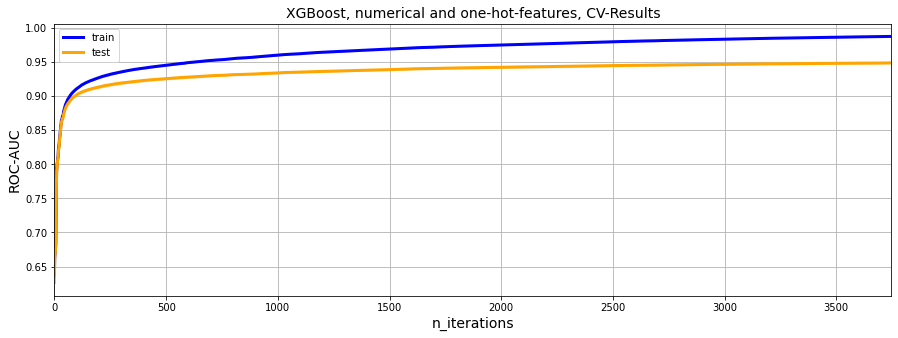

In [60]:
fig = plt.figure(figsize=(15, 5))
plt.plot(cv_result_xgb_all["train-auc-mean"], color="blue", linewidth=3, label="train")
plt.plot(cv_result_xgb_all["test-auc-mean"], color="orange", linewidth=3, label="test")
plt.fill_between(
    x=cv_result_xgb_all.index,
    y1=cv_result_xgb_all["train-auc-mean"] - cv_result_xgb_all["train-auc-std"],
    y2=cv_result_xgb_all["train-auc-mean"] + cv_result_xgb_all["train-auc-std"],
    alpha=0.25, color="blue"
)
plt.fill_between(
    x=cv_result_xgb_all.index,
    y1=cv_result_xgb_all["test-auc-mean"] - cv_result_xgb_all["test-auc-std"],
    y2=cv_result_xgb_all["test-auc-mean"] + cv_result_xgb_all["test-auc-std"],
    alpha=0.25, color="orange"
)
plt.title("XGBoost, numerical and one-hot-features, CV-Results", size=14)
plt.xlabel("n_iterations", size=14)
plt.xlim(0, cv_result_xgb_all.index.max())
plt.ylabel("ROC-AUC", size=14)
plt.legend(loc="best")
plt.grid()

Вывод: обработка категориальных переменных и включение их в модель дает прирост по test-auc-mean для XGBoost, равный 0.01

## 4. Задание 4: для числовых признаков обучить модель LightGBM. Обучать алгоритм до тех пор, пока метрика качества не перестанет улучшаться на валидационной выборке в течение определенного числа итераций (выбрать значение самостоятельно).

In [61]:
dtrain = lgb.Dataset(
    data=numerical_features, label=target
)

In [62]:
params = {
    "boosting_type ": "gbdt",
    "objective": "binary",
    "eval_metric": "auc",
    "learning_rate": 0.1,
    "num_boost_round ": 1000,
    "reg_lambda": 100,
    "max_depth": 4,
    "n_jobs": -1,
    "seed": 27,
    'device_type': 'cpu'
}

In [64]:
cv_result_lgb_num = lgb.cv(
    params=params,
    train_set=dtrain,
    num_boost_round=1000,
    categorical_feature="auto",
    early_stopping_rounds=25,
    verbose_eval=25,
    stratified=True,
    seed=42,
    metrics="auc",
    shuffle=True,
    nfold=3,
)

[25]	cv_agg's auc: 0.872062 + 0.00326204
[50]	cv_agg's auc: 0.885345 + 0.00259502
[75]	cv_agg's auc: 0.891156 + 0.0020265
[100]	cv_agg's auc: 0.895398 + 0.0021054
[125]	cv_agg's auc: 0.898915 + 0.00205439
[150]	cv_agg's auc: 0.901526 + 0.00237428
[175]	cv_agg's auc: 0.903849 + 0.00237595
[200]	cv_agg's auc: 0.905972 + 0.00234529
[225]	cv_agg's auc: 0.907724 + 0.00232666
[250]	cv_agg's auc: 0.909162 + 0.00212529
[275]	cv_agg's auc: 0.910566 + 0.00206555
[300]	cv_agg's auc: 0.911689 + 0.00214831
[325]	cv_agg's auc: 0.912632 + 0.00205924
[350]	cv_agg's auc: 0.913427 + 0.00212794
[375]	cv_agg's auc: 0.914317 + 0.00197979
[400]	cv_agg's auc: 0.914921 + 0.00198221
[425]	cv_agg's auc: 0.915595 + 0.00210787
[450]	cv_agg's auc: 0.916346 + 0.00205572
[475]	cv_agg's auc: 0.916916 + 0.00193941
[500]	cv_agg's auc: 0.917589 + 0.00206529
[525]	cv_agg's auc: 0.918165 + 0.00204568
[550]	cv_agg's auc: 0.9187 + 0.00206315
[575]	cv_agg's auc: 0.919209 + 0.00196566
[600]	cv_agg's auc: 0.91975 + 0.00193619


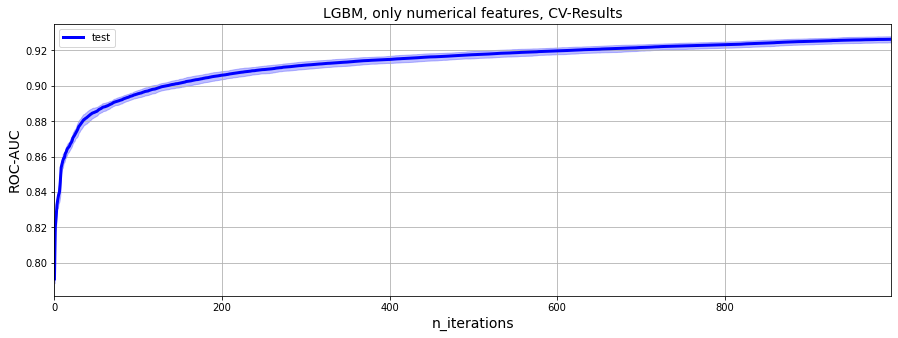

In [ ]:
fig = plt.figure(figsize=(15, 5))
plt.plot(cv_result_lgb_num["auc-mean"], color="blue", linewidth=3, label="test")
plt.fill_between(
    x=np.arange(len(cv_result_lgb_num["auc-mean"])),
    y1=np.array(cv_result_lgb_num["auc-mean"]) - np.array(cv_result_lgb_num["auc-stdv"]),
    y2=np.array(cv_result_lgb_num["auc-mean"]) + np.array(cv_result_lgb_num["auc-stdv"]),
    alpha=0.25, color="blue"
)

plt.title("LGBM, only numerical features, CV-Results", size=14)
plt.xlabel("n_iterations", size=14)
plt.xlim(0, len(cv_result_lgb_num["auc-mean"]))
plt.ylabel("ROC-AUC", size=14)
plt.legend(loc="best")
plt.grid()

## 5. Задание 5: обработать категориальные признаки любым способом (который вы знаете) и добавить их к данным. Выполнить задание 4.

In [ ]:
dtrain = lgb.Dataset(
    data=numerical_one_hot_features, label=target
)

In [ ]:
cv_result_lgb_all = lgb.cv(
    params=params,
    train_set=dtrain,
    num_boost_round=1000,
    categorical_feature="auto",
    early_stopping_rounds=25,
    verbose_eval=25,
    stratified=True,
    seed=42,
    metrics="auc",
    shuffle=True,
    nfold=3
)

[25]	cv_agg's auc: 0.879118 + 0.00203848
[50]	cv_agg's auc: 0.891862 + 0.00170508
[75]	cv_agg's auc: 0.898762 + 0.00117734
[100]	cv_agg's auc: 0.903324 + 0.00113669
[125]	cv_agg's auc: 0.906236 + 0.00123212
[150]	cv_agg's auc: 0.909146 + 0.00134585
[175]	cv_agg's auc: 0.911091 + 0.00157019
[200]	cv_agg's auc: 0.913108 + 0.00143961
[225]	cv_agg's auc: 0.914795 + 0.00130721
[250]	cv_agg's auc: 0.916167 + 0.00146342
[275]	cv_agg's auc: 0.917259 + 0.00131288
[300]	cv_agg's auc: 0.918234 + 0.00131456
[325]	cv_agg's auc: 0.919178 + 0.00120226
[350]	cv_agg's auc: 0.920111 + 0.00124745
[375]	cv_agg's auc: 0.92108 + 0.00144841
[400]	cv_agg's auc: 0.921891 + 0.00144882
[425]	cv_agg's auc: 0.922579 + 0.00137088
[450]	cv_agg's auc: 0.923267 + 0.00121438
[475]	cv_agg's auc: 0.924048 + 0.00120265
[500]	cv_agg's auc: 0.92469 + 0.00124016
[525]	cv_agg's auc: 0.925293 + 0.0011732
[550]	cv_agg's auc: 0.925945 + 0.00118002
[575]	cv_agg's auc: 0.926484 + 0.00126206
[600]	cv_agg's auc: 0.926958 + 0.00117
[

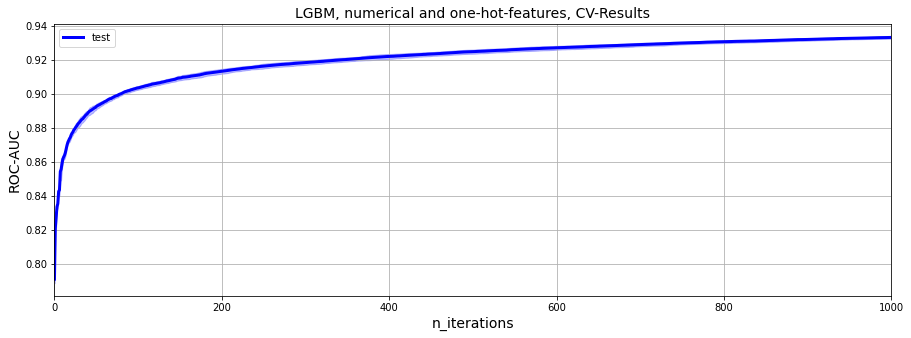

In [ ]:
fig = plt.figure(figsize=(15, 5))
plt.plot(cv_result_lgb_all["auc-mean"], color="blue", linewidth=3, label="test")
plt.fill_between(
    x=np.arange(len(cv_result_lgb_all["auc-mean"])),
    y1=np.array(cv_result_lgb_all["auc-mean"]) - np.array(cv_result_lgb_all["auc-stdv"]),
    y2=np.array(cv_result_lgb_all["auc-mean"]) + np.array(cv_result_lgb_all["auc-stdv"]),
    alpha=0.25, color="blue"
)

plt.title("LGBM, numerical and one-hot-features, CV-Results", size=14)
plt.xlabel("n_iterations", size=14)
plt.xlim(0, len(cv_result_lgb_all["auc-mean"]))
plt.ylabel("ROC-AUC", size=14)
plt.legend(loc="best")
plt.grid()

Вывод: обработка категориальных переменных и включение их в модель дает прирост по auc для LightGBM, равный 0.007

## 6. Задание 6: обработать категориальные признаки встроенным методом в LightGBM. Выполнить задание 4. Сделать выводы о качестве работы алгоритма, по сравнению с пунктом 5.

In [31]:
numerical_categorical_features = pd.concat([numerical_features, categorical_features], axis=1)

In [29]:
categorical_feature_names = categorical_features.columns.to_list()

In [ ]:
for feature in categorical_feature_names:
    numerical_categorical_features[feature] = pd.Series(numerical_categorical_features[feature], dtype="category")

dtrain = lgb.Dataset(
    data=numerical_categorical_features, label=target
)

In [ ]:
cv_result_lgb_all_not_dummies = lgb.cv(
    params=params,
    train_set=dtrain,
    num_boost_round=1000,
    categorical_feature=categorical_feature_names,
    early_stopping_rounds=25,
    verbose_eval=25,
    stratified=True,
    seed=42,
    metrics="auc",
    shuffle=True,
    nfold=3
)

/usr/local/lib/python3.7/dist-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is ['M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'P_emaildomain', 'ProductCD', 'R_emaildomain', 'card4', 'card6']
  data, feature_name, categorical_feature, self.pandas_categorical = _data_from_pandas(data,


[25]	cv_agg's auc: 0.882644 + 0.00117536
[50]	cv_agg's auc: 0.893936 + 0.00111753
[75]	cv_agg's auc: 0.900456 + 0.00100928
[100]	cv_agg's auc: 0.904576 + 0.000840353
[125]	cv_agg's auc: 0.90771 + 0.00106358
[150]	cv_agg's auc: 0.910126 + 0.00119623
[175]	cv_agg's auc: 0.912037 + 0.00130888
[200]	cv_agg's auc: 0.914147 + 0.00119314
[225]	cv_agg's auc: 0.915813 + 0.00112236
[250]	cv_agg's auc: 0.917246 + 0.000939019
[275]	cv_agg's auc: 0.918536 + 0.0010162
[300]	cv_agg's auc: 0.919816 + 0.000878652
[325]	cv_agg's auc: 0.920805 + 0.000801899
[350]	cv_agg's auc: 0.921765 + 0.000766584
[375]	cv_agg's auc: 0.922534 + 0.00046897
[400]	cv_agg's auc: 0.923389 + 0.000533554
[425]	cv_agg's auc: 0.923989 + 0.000487878
[450]	cv_agg's auc: 0.924703 + 0.000478964
[475]	cv_agg's auc: 0.9255 + 0.000431882
[500]	cv_agg's auc: 0.926078 + 0.000294277
[525]	cv_agg's auc: 0.926812 + 0.000166155
[550]	cv_agg's auc: 0.927427 + 0.000188017
[575]	cv_agg's auc: 0.92787 + 0.000165833
[600]	cv_agg's auc: 0.928342 

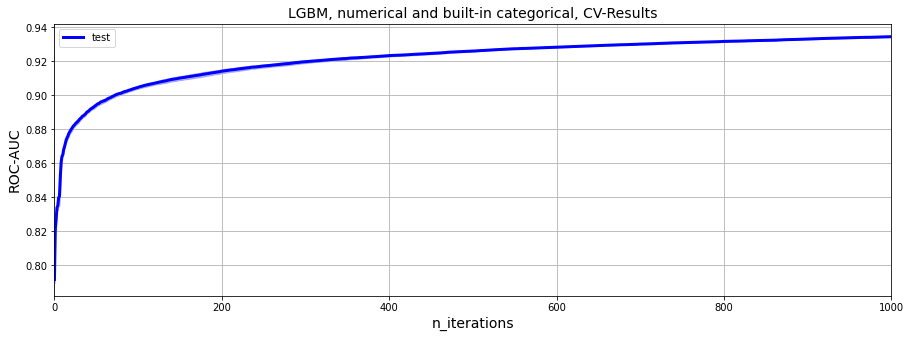

In [ ]:
fig = plt.figure(figsize=(15, 5))
plt.plot(cv_result_lgb_all_not_dummies["auc-mean"], color="blue", linewidth=3, label="test")
plt.fill_between(
    x=np.arange(len(cv_result_lgb_all_not_dummies["auc-mean"])),
    y1=np.array(cv_result_lgb_all_not_dummies["auc-mean"]) - np.array(cv_result_lgb_all_not_dummies["auc-stdv"]),
    y2=np.array(cv_result_lgb_all_not_dummies["auc-mean"]) + np.array(cv_result_lgb_all_not_dummies["auc-stdv"]),
    alpha=0.25, color="blue"
)

plt.title("LGBM, numerical and built-in categorical, CV-Results", size=14)
plt.xlabel("n_iterations", size=14)
plt.xlim(0, len(cv_result_lgb_all_not_dummies["auc-mean"]))
plt.ylabel("ROC-AUC", size=14)
plt.legend(loc="best")
plt.grid()

Вывод: улучшение auc по сравнению с LightGBM, при котором признаки были обработаны вручную, - 0.001

## 7. Задание 7: для числовых признаков обучить модель CatBoost. Обучать алгоритм до тех пор, пока метрика качества не перестанет улучшаться на валидационной выборке в течение определенного числа итераций (выбрать значение самостоятельно).

In [11]:
!pip install catboost

In [12]:
import catboost as cb

In [35]:
cb_params = {
    "n_estimators": 1000,
    "loss_function": "Logloss",
    "eval_metric": "AUC",
    "task_type": "CPU",
    "max_bin": 20,
    "verbose": 25,
    "max_depth": 4,
    "l2_leaf_reg": 100,
    "early_stopping_rounds": 25,
    "thread_count": 6,
    "random_seed": 27,
    'learning_rate': 0.1,
    'task_type': 'GPU',
    'one_hot_max_size': 100
}

In [36]:
cv_result_catb_num = cb.cv(
    pool = cb.Pool(numerical_features, target),
    params = cb_params,
    plot=True,
    shuffle = True,
    stratified = True,
    seed = 42,
    iterations = 10000,
    early_stopping_rounds = 25,
    fold_count = 3,
    as_pandas = True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.6082671	best: 0.6082671 (0)
25:	test: 0.8346557	best: 0.8346557 (25)
50:	test: 0.8566824	best: 0.8566824 (50)
75:	test: 0.8659997	best: 0.8659997 (75)
100:	test: 0.8716930	best: 0.8716930 (100)
125:	test: 0.8764539	best: 0.8764539 (125)
150:	test: 0.8788200	best: 0.8788200 (150)
175:	test: 0.8805482	best: 0.8805482 (175)
200:	test: 0.8822176	best: 0.8822176 (200)
225:	test: 0.8833668	best: 0.8833668 (225)
250:	test: 0.8848079	best: 0.8848313 (248)
275:	test: 0.8857656	best: 0.8857656 (275)
300:	test: 0.8868157	best: 0.8868157 (300)
325:	test: 0.8880440	best: 0.8880440 (325)
350:	test: 0.8886226	best: 0.8886226 (350)
375:	test: 0.8892462	best: 0.8892492 (374)
400:	test: 0.8898065	best: 0.8898065 (400)
425:	test: 0.8905976	best: 0.8905976 (425)
450:	test: 0.8913220	best: 0.8913220 (450)
475:	test: 0.8918384	best: 0.8918384 (475)
500:	test: 0.8923446	best: 0.8923446 (500)
525:	test: 0.8925824	best: 0.8925824 (525)
550:	test: 0.8930364	best: 0.8930378 (549)
575:	test: 0.8933771	

In [37]:
cv_result_catb_num.tail(3)

,iterations,test-AUC-mean,test-AUC-std,test-Logloss-mean,test-Logloss-std,train-Logloss-mean,train-Logloss-std
5353,5353,0.919470,0.002368,0.063792,0.001361,0.053429,0.0019
5354,5354,0.919468,0.002369,0.063792,0.001361,0.053429,0.0019
5355,5355,0.919468,0.002369,0.063792,0.001362,0.053429,0.0019


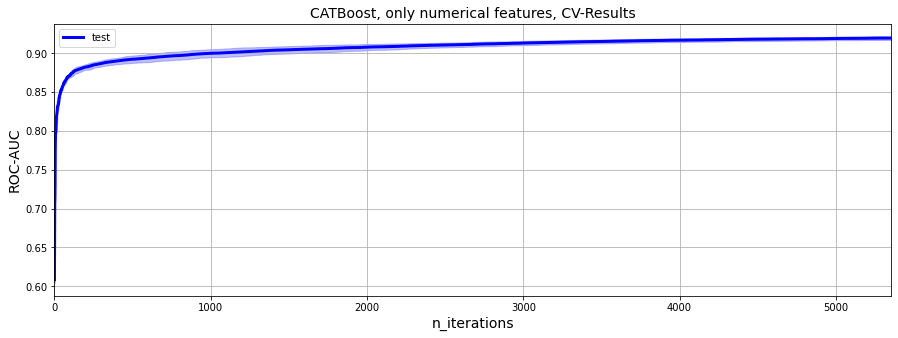

In [38]:
fig = plt.figure(figsize=(15, 5))
plt.plot(cv_result_catb_num["test-AUC-mean"], color="blue", linewidth=3, label="test")
plt.fill_between(
    x=np.arange(len(cv_result_catb_num["test-AUC-mean"])),
    y1=np.array(cv_result_catb_num["test-AUC-mean"]) - np.array(cv_result_catb_num["test-AUC-std"]),
    y2=np.array(cv_result_catb_num["test-AUC-mean"]) + np.array(cv_result_catb_num["test-AUC-std"]),
    alpha=0.25, color="blue"
)

plt.title("CATBoost, only numerical features, CV-Results", size=14)
plt.xlabel("n_iterations", size=14)
plt.xlim(0, len(cv_result_catb_num["test-AUC-mean"]))
plt.ylabel("ROC-AUC", size=14)
plt.legend(loc="best")
plt.grid()

## 8. Задание 8: обработать категориальные признаки любым способом (который вы знаете) и добавить их к данным. Выполнить задание 7.

In [39]:
cb_params = {
    "n_estimators": 1000,
    "loss_function": "Logloss",
    "eval_metric": "AUC",
    "task_type": "CPU",
    "max_bin": 20,
    "verbose": 25,
    "max_depth": 4,
    "l2_leaf_reg": 100,
    "early_stopping_rounds": 25,
    "thread_count": 6,
    "random_seed": 27,
    'learning_rate': 0.1,
    'task_type': 'GPU',
}

In [40]:
cv_result_catb_dummies = cb.cv(
    pool = cb.Pool(numerical_one_hot_features, target),
    params = cb_params,
    plot=True,
    shuffle = True,
    stratified = True,
    seed = 42,
    iterations = 10000,
    early_stopping_rounds = 25,
    fold_count = 3,
    as_pandas = True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.6026538	best: 0.6026538 (0)
25:	test: 0.8496785	best: 0.8496785 (25)
50:	test: 0.8631409	best: 0.8631409 (50)
75:	test: 0.8747035	best: 0.8747035 (75)
100:	test: 0.8796050	best: 0.8796050 (100)
125:	test: 0.8842819	best: 0.8842834 (124)
150:	test: 0.8866419	best: 0.8866419 (150)
175:	test: 0.8886297	best: 0.8886297 (175)
200:	test: 0.8899689	best: 0.8899689 (200)
225:	test: 0.8912501	best: 0.8912501 (225)
250:	test: 0.8923263	best: 0.8923263 (250)
275:	test: 0.8935787	best: 0.8935787 (275)
300:	test: 0.8951246	best: 0.8951246 (300)
325:	test: 0.8960867	best: 0.8960867 (325)
350:	test: 0.8968052	best: 0.8968052 (350)
375:	test: 0.8973625	best: 0.8973814 (374)
400:	test: 0.8979600	best: 0.8979600 (400)
425:	test: 0.8988259	best: 0.8988695 (424)
450:	test: 0.8995511	best: 0.8995511 (450)
475:	test: 0.9001053	best: 0.9001053 (475)
500:	test: 0.9005864	best: 0.9005864 (500)
525:	test: 0.9009534	best: 0.9009534 (525)
550:	test: 0.9014538	best: 0.9014611 (549)
575:	test: 0.9018633	

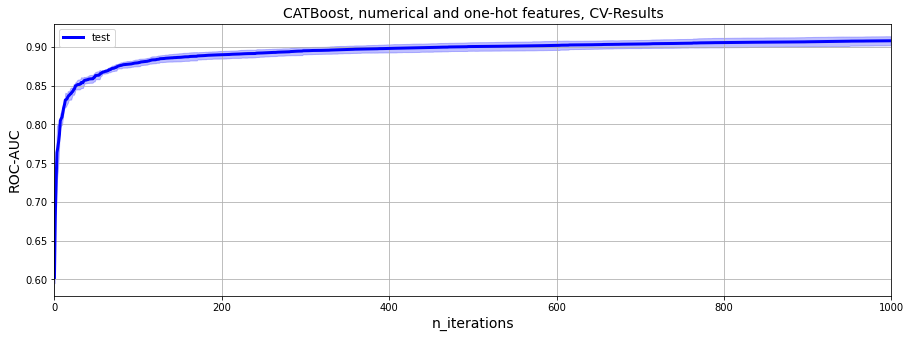

In [27]:
fig = plt.figure(figsize=(15, 5))
plt.plot(cv_result_catb_dummies["test-AUC-mean"], color="blue", linewidth=3, label="test")
plt.fill_between(
    x=np.arange(len(cv_result_catb_dummies["test-AUC-mean"])),
    y1=np.array(cv_result_catb_dummies["test-AUC-mean"]) - np.array(cv_result_catb_dummies["test-AUC-std"]),
    y2=np.array(cv_result_catb_dummies["test-AUC-mean"]) + np.array(cv_result_catb_dummies["test-AUC-std"]),
    alpha=0.25, color="blue"
)

plt.title("CATBoost, numerical and one-hot features, CV-Results", size=14)
plt.xlabel("n_iterations", size=14)
plt.xlim(0, len(cv_result_catb_dummies["test-AUC-mean"]))
plt.ylabel("ROC-AUC", size=14)
plt.legend(loc="best")
plt.grid()

Вывод: обработка категориальных переменных и включение их в модель дает прирост по auc для CatBoost, равный 0.007

## 9. Задание 9: обработать категориальные признаки встроенным методом в CatBoost. Выполнить задание 7. Сделать выводы о качестве работы алгоритма, по сравнению с пунктом 8.

In [32]:
for feature in categorical_feature_names:
    numerical_categorical_features[feature] = numerical_categorical_features[feature].astype(str)

In [95]:
cb_params = {
    "n_estimators": 1000,
    "loss_function": "Logloss",
    "eval_metric": "AUC",
    "task_type": "CPU",
    "max_bin": 20,
    "verbose": 25,
    "max_depth": 4,
    "l2_leaf_reg": 100,
    "early_stopping_rounds": 25,
    "thread_count": 6,
    "random_seed": 27,
    'learning_rate': 0.1,
    'task_type': 'GPU',
    'one_hot_max_size': 100
}

In [96]:
cv_result_catb_autodummies = cb.cv(
    pool = cb.Pool(numerical_categorical_features, target, cat_features=categorical_feature_names),
    params = cb_params,
    plot=True,
    shuffle = True,
    stratified = True,
    seed = 42,
    iterations = 10000,
    early_stopping_rounds = 25,
    fold_count = 3,
    as_pandas = True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.6083531	best: 0.6083531 (0)
25:	test: 0.8445529	best: 0.8445529 (25)
50:	test: 0.8587613	best: 0.8587613 (50)
75:	test: 0.8717119	best: 0.8717119 (75)
100:	test: 0.8796726	best: 0.8796726 (100)
125:	test: 0.8840841	best: 0.8840841 (125)
150:	test: 0.8867213	best: 0.8867213 (150)
175:	test: 0.8888303	best: 0.8888303 (175)
200:	test: 0.8906598	best: 0.8906598 (200)
225:	test: 0.8923006	best: 0.8923006 (225)
250:	test: 0.8934299	best: 0.8934299 (250)
275:	test: 0.8945063	best: 0.8945063 (275)
300:	test: 0.8958713	best: 0.8958844 (299)
325:	test: 0.8968169	best: 0.8968169 (325)
350:	test: 0.8976699	best: 0.8976699 (350)
375:	test: 0.8986005	best: 0.8986005 (375)
400:	test: 0.8993048	best: 0.8993048 (400)
425:	test: 0.8997588	best: 0.8997588 (425)
450:	test: 0.9000182	best: 0.9000182 (450)
475:	test: 0.9005545	best: 0.9005545 (475)
500:	test: 0.9009123	best: 0.9009123 (500)
525:	test: 0.9014213	best: 0.9014213 (525)
550:	test: 0.9020164	best: 0.9020164 (550)
575:	test: 0.9023092	

Вывод: ухудшение auc по сравнению с CatBoost, при котором признаки были обработаны вручную, - 0.005

## 10. Задание 10: построить ROC-кривую для всех построенных алгоритмов на обучающей и тестовой выборке. Сделать выводы о работе алгоритмов с точки зрения качества на тестовой выборке и с точки зрения переобучения.

### Обучние XGBoost-модели

In [65]:
params = {
    "booster": "gbtree",
    "objective": "binary:logistic",
    "eval_metric": "auc",
    "learning_rate": 0.1,
    "n_estimators": 1000,
    "reg_lambda": 100,
    "max_depth": 4,
    "gamma": 10,
    "nthread": -1,
    "seed": 27,
    'tree_method': 'gpu_hist'
}

In [66]:
dataset = pd.concat([train, test], axis=0)
dataset = one_hot_features = pd.get_dummies(dataset)
train_one_hot = dataset.iloc[:180000]
test_one_hot = dataset.iloc[180000:]

In [67]:
train_target = train_one_hot['isFraud']
train_one_hot.drop(columns=['isFraud'], inplace=True)
test_target = test_one_hot['isFraud']
test_one_hot.drop(columns=['isFraud'], inplace=True)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [68]:
dtrain = xgb.DMatrix(
    data=train_one_hot, label=train_target
)
dtest = xgb.DMatrix(
    data=test_one_hot, label=test_target
)

In [69]:
model_xgb = xgb.train(
    params=params,
    dtrain=dtrain,
    num_boost_round=5000,
    early_stopping_rounds=50,
    evals=[(dtrain, "train"), (dtest, "valid")],
    verbose_eval=50,
    maximize=True,
)

[0]	train-auc:0.650007	valid-auc:0.622398
Multiple eval metrics have been passed: 'valid-auc' will be used for early stopping.

Will train until valid-auc hasn't improved in 50 rounds.
[50]	train-auc:0.888482	valid-auc:0.857354
[100]	train-auc:0.910613	valid-auc:0.864032
[150]	train-auc:0.920137	valid-auc:0.86738
[200]	train-auc:0.925828	valid-auc:0.869589
[250]	train-auc:0.93015	valid-auc:0.870485
[300]	train-auc:0.933703	valid-auc:0.871349
[350]	train-auc:0.936301	valid-auc:0.871087
Stopping. Best iteration:
[302]	train-auc:0.933865	valid-auc:0.871388



In [70]:
train_pred = model_xgb.predict(dtrain)
test_pred = model_xgb.predict(dtest)

In [71]:
from sklearn import metrics

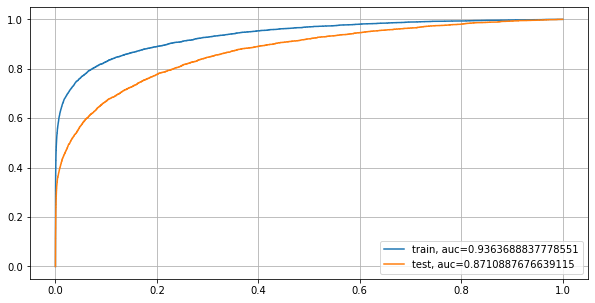

In [73]:
fig = plt.figure(figsize=(10, 5))
train_fpr_xgb, train_tpr_xgb, _ = metrics.roc_curve(train_target,  train_pred)
train_auc_xgb = metrics.roc_auc_score(train_target, train_pred)
test_fpr_xgb, test_tpr_xgb, _ = metrics.roc_curve(test_target,  test_pred)
test_auc_xgb = metrics.roc_auc_score(test_target, test_pred)
plt.plot(train_fpr_xgb,train_tpr_xgb,label="train, auc="+str(train_auc_xgb))
plt.plot(test_fpr_xgb,test_tpr_xgb,label="test, auc="+str(test_auc_xgb))
plt.legend(loc=4)
plt.grid()
plt.show()

### Обучение LightGBM-модели

In [74]:
train_lgb = train.drop(columns=['isFraud'])
test_lgb = test.drop(columns=['isFraud'])

In [75]:
for feature in categorical_feature_names:
    train_lgb[feature] = pd.Series(train_lgb[feature], dtype="category")

for feature in categorical_feature_names:
    test_lgb[feature] = pd.Series(test_lgb[feature], dtype="category")

In [76]:
dtrain = lgb.Dataset(
    data=train_lgb, label=train_target
)

dtest = lgb.Dataset(
    data=test_lgb, label=test_target
)

In [77]:
params = {
    "boosting_type ": "gbdt",
    "objective": "binary",
    "eval_metric": "auc",
    "learning_rate": 0.1,
    "num_boost_round ": 1000,
    "reg_lambda": 100,
    "max_depth": 4,
    "n_jobs": -1,
    "seed": 27,
    'device_type': 'cpu'
}

In [78]:
model_lgb = lgb.train(
    params=params,
    train_set=dtrain,
    num_boost_round=5000,
    valid_sets=[dtest],
    categorical_feature=categorical_feature_names,
    early_stopping_rounds=50,
    verbose_eval=50
)

/usr/local/lib/python3.7/dist-packages/lightgbm/basic.py:1209: UserWarning: categorical_feature in Dataset is overridden.
New categorical_feature is ['M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'P_emaildomain', 'ProductCD', 'R_emaildomain', 'card4', 'card6']
  'New categorical_feature is {}'.format(sorted(list(categorical_feature))))
/usr/local/lib/python3.7/dist-packages/lightgbm/basic.py:762: UserWarning: categorical_feature in param dict is overridden.
  warnings.warn('categorical_feature in param dict is overridden.')


Training until validation scores don't improve for 50 rounds.
[50]	valid_0's binary_logloss: 0.111833
[100]	valid_0's binary_logloss: 0.10892
[150]	valid_0's binary_logloss: 0.107624
[200]	valid_0's binary_logloss: 0.106807
[250]	valid_0's binary_logloss: 0.106502
[300]	valid_0's binary_logloss: 0.106531
[350]	valid_0's binary_logloss: 0.106623
Early stopping, best iteration is:
[313]	valid_0's binary_logloss: 0.106435


In [79]:
train_pred = model_lgb.predict(train_lgb)
test_pred = model_lgb.predict(test_lgb)

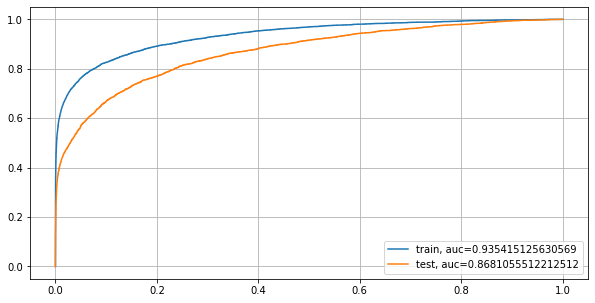

In [80]:
fig = plt.figure(figsize=(10, 5))
train_fpr_lgb, train_tpr_lgb, _ = metrics.roc_curve(train_target,  train_pred)
train_auc_lgb = metrics.roc_auc_score(train_target, train_pred)
test_fpr_lgb, test_tpr_lgb, _ = metrics.roc_curve(test_target,  test_pred)
test_auc_lgb = metrics.roc_auc_score(test_target, test_pred)
plt.plot(train_fpr_lgb, train_tpr_lgb, label="train, auc="+str(train_auc_lgb))
plt.plot(test_fpr_lgb, test_tpr_lgb, label="test, auc="+str(test_auc_lgb))
plt.legend(loc=4)
plt.grid()
plt.show()

### Обучение CatBoost-модели

In [81]:
train_catb = train.drop(columns=['isFraud'])
test_catb = test.drop(columns=['isFraud'])

In [82]:
for feature in categorical_feature_names:
    train_catb[feature] = train_catb[feature].astype(str)

for feature in categorical_feature_names:
    test_catb[feature] = test_catb[feature].astype(str)

In [83]:
cb_params = {
    "n_estimators": 5000,
    "loss_function": "Logloss",
    "eval_metric": "AUC",
    "task_type": "CPU",
    "max_bin": 20,
    "verbose": 50,
    "max_depth": 4,
    "l2_leaf_reg": 100,
    "early_stopping_rounds": 50,
    "thread_count": 6,
    "random_seed": 27,
    'learning_rate': 0.1,
    'task_type': 'GPU',
    'one_hot_max_size': 100
}

In [84]:
model_catb = cb.CatBoostClassifier(**cb_params)
model_catb.fit(train_catb, train_target, eval_set=[(test_catb, test_target)], cat_features=categorical_feature_names)

0:	learn: 0.6467923	test: 0.6017068	best: 0.6017068 (0)	total: 14.9ms	remaining: 1m 14s
50:	learn: 0.8671744	test: 0.8357154	best: 0.8360181 (48)	total: 743ms	remaining: 1m 12s
100:	learn: 0.8826127	test: 0.8534448	best: 0.8535403 (94)	total: 1.41s	remaining: 1m 8s
150:	learn: 0.8877084	test: 0.8557205	best: 0.8558553 (148)	total: 2.14s	remaining: 1m 8s
200:	learn: 0.8928869	test: 0.8588791	best: 0.8588791 (200)	total: 2.85s	remaining: 1m 8s
250:	learn: 0.8960189	test: 0.8602443	best: 0.8602828 (248)	total: 3.57s	remaining: 1m 7s
300:	learn: 0.8983646	test: 0.8607857	best: 0.8608740 (295)	total: 4.29s	remaining: 1m 6s
350:	learn: 0.9006808	test: 0.8623536	best: 0.8624206 (336)	total: 5.01s	remaining: 1m 6s
400:	learn: 0.9024337	test: 0.8636805	best: 0.8637243 (377)	total: 5.73s	remaining: 1m 5s
450:	learn: 0.9040882	test: 0.8647870	best: 0.8648713 (446)	total: 6.41s	remaining: 1m 4s
500:	learn: 0.9057074	test: 0.8652984	best: 0.8653213 (493)	total: 7.07s	remaining: 1m 3s
550:	learn: 0.

In [85]:
train_pred = model_catb.predict_proba(train_catb)
test_pred = model_catb.predict_proba(test_catb)

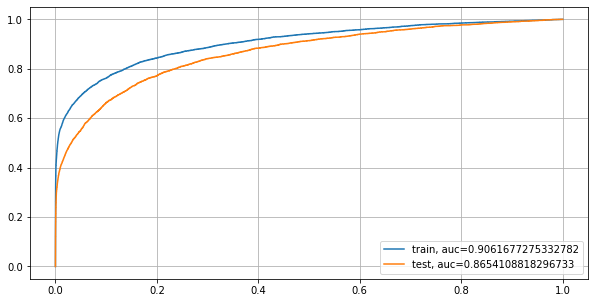

In [86]:
fig = plt.figure(figsize=(10, 5))
train_fpr_catb, train_tpr_catb, _ = metrics.roc_curve(train_target,  train_pred[:,1])
train_auc_catb = metrics.roc_auc_score(train_target, train_pred[:,1])
test_fpr_catb, test_tpr_catb, _ = metrics.roc_curve(test_target,  test_pred[:,1])
test_auc_catb = metrics.roc_auc_score(test_target, test_pred[:,1])
plt.plot(train_fpr_catb, train_tpr_catb, label="train, auc="+str(train_auc_catb))
plt.plot(test_fpr_catb, test_tpr_catb, label="test, auc="+str(test_auc_catb))
plt.legend(loc=4)
plt.grid()
plt.show()

### Вывод итоговых графиков

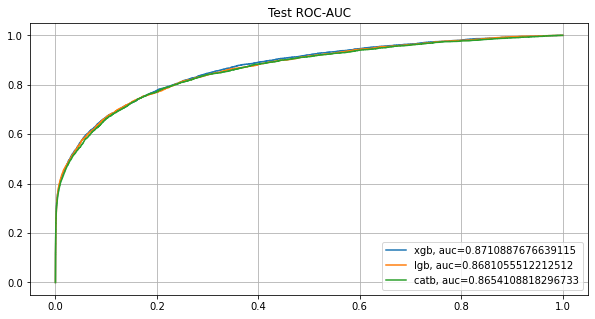

In [89]:
fig = plt.figure(figsize=(10, 5))
plt.plot(test_fpr_xgb, test_tpr_xgb , label="xgb, auc="+str(test_auc_xgb))
plt.plot(test_fpr_lgb, test_tpr_lgb, label="lgb, auc="+str(test_auc_lgb))
plt.plot(test_fpr_catb, test_tpr_catb, label="catb, auc="+str(test_auc_catb))
plt.legend(loc=4)
plt.grid()
plt.title('Test ROC-AUC')
plt.show()

Вывод: наибольшая точность на тестовом датасете - у алгоритма XGBoost. Наименьшая разница между точностью на тренировочном и тестовом датасетах - у алгоритма CatBoost

## 11. Задание 1: Построить график распределения времени совершения транзакции для обучающей / тестовой выборки, сделать выводы о том, как разбиты данные и какие виды валидации могут подойти для данной задачи.

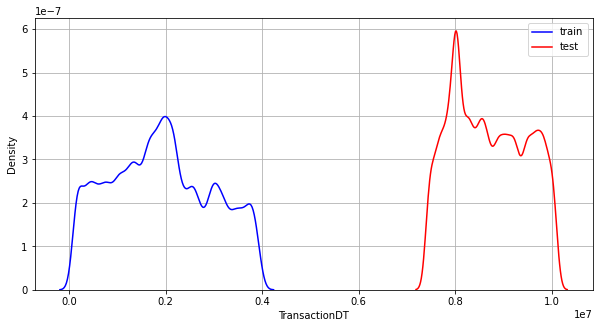

In [ ]:
fig = plt.figure(figsize=(10, 5))
sns.kdeplot(train['TransactionDT'], color="blue", label="train")
sns.kdeplot(test['TransactionDT'], color="red", label="test")
plt.legend()
plt.grid()

Выводы: графики распределения времени совершения транзакции для тренировочного и тестового датасета смещены по оси времени и различны по форме. Данные для датасетов собирались в разные моменты времени. Правильнее обучаться на более ранних данных, а валидироваться - на более поздних. 

## 12. Задание 2: построить scatter-plot зависимости суммы транзакции от времени совершения транзакции. Построить графики для обучающей выборки и для тестовой выборки, для обучающей выборки - построить как для целевой переменной = 0, так и для переменной = 1. Сделать выводы.

In [ ]:
train.head(3)

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,...,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,credit,315.0,87.0,19.0,NaN,NaN,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,debit,330.0,87.0,287.0,NaN,outlook.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


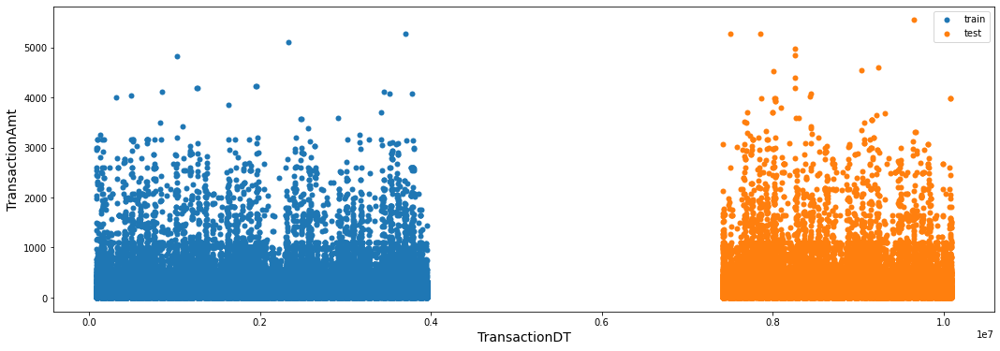

In [97]:
fig = plt.figure(figsize=(18, 6))
sns.scatterplot(x=train['TransactionDT'], y=train["TransactionAmt"], alpha=1, label='train', linewidth=0)
sns.scatterplot(x=test['TransactionDT'], y=test["TransactionAmt"], alpha=1, label='test', linewidth=0)
plt.ylabel("TransactionAmt", size=14)
plt.xlabel('TransactionDT', size=14)
plt.legend()

Вывод: больше всего транзакций - на сумму менее 1000. По оси времени наблюдается цикличная зависимость числа транзакций. Выборки выглядят идентичными.

In [99]:
train_fraud = train.loc[train['isFraud']==1]
train_not_fraud = train.loc[train['isFraud']==0]

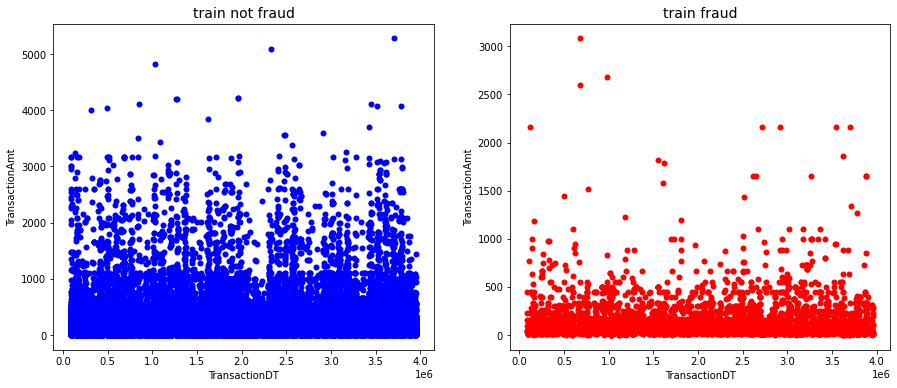

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(15, 6))
axes[0].set_title("train not fraud", fontsize=14)
sns.scatterplot(x=train_not_fraud['TransactionDT'], y=train_not_fraud["TransactionAmt"], ax=axes[0], color='blue', linewidth=0)
axes[1].set_title("train fraud", fontsize=14)
sns.scatterplot(x=train_fraud['TransactionDT'], y=train_fraud["TransactionAmt"], ax=axes[1], color='red', linewidth=0)

Вывод: на графике с мошенническими транзакциями менее выражена циклическая составляющая и суммы таких транзакций в среднем ниже, чем суммы немошеннических

## 13. Задание 3: построить распределение признака TransactionAmt в логарифмическом масштабе, сделать выводы о близости распредления к нормальному распределению. Построить распределение признака в логарифмическом масштабе для обучающей выборк и для тестовой выборки, сделать выводы.

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


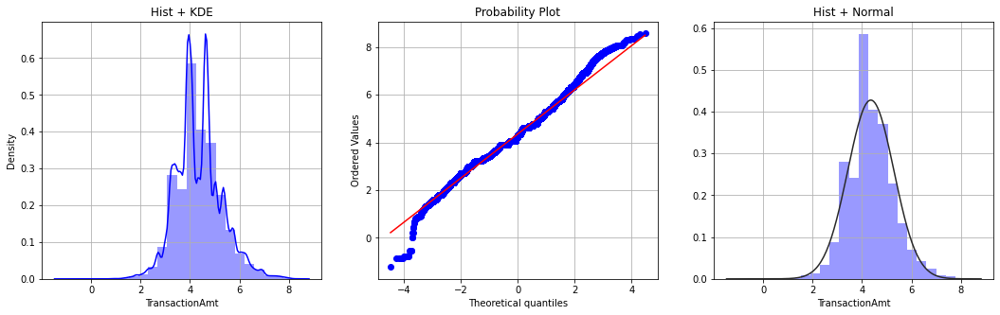

In [ ]:
target = np.log(train['TransactionAmt'])
fig = plt.figure(figsize=(18, 5))
plt.subplot(131)
sns.distplot(target, bins=25, color="blue")
plt.title('Hist + KDE')
plt.grid()
plt.subplot(132)
probplot(target, plot=plt)
plt.grid()
plt.subplot(133)
sns.distplot(target, bins=25, kde=False, color="blue", fit=st.norm)
plt.title('Hist + Normal')
plt.grid()
plt.show()

Вывод: в логарифмическом масштабе TransactionAmt близко к нормальному растпределению

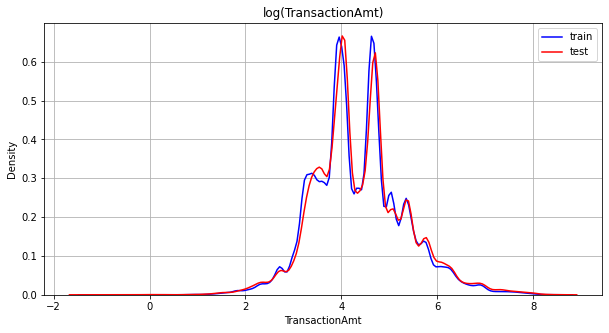

In [110]:
fig = plt.figure(figsize=(10, 5))
sns.kdeplot(np.log(train['TransactionAmt']), color='blue', label='train')
sns.kdeplot(np.log(test['TransactionAmt']), color='red', label='test')
plt.legend()
plt.title('log(TransactionAmt)')
plt.grid()

Вывод: распределение признака TransactionAmt в логарифмическом масштабе для обучающей выборки и для тестовой выборки идентично

## 14. Задание 4: построить распределение признака целевой переменной в зависимости от значений категориальных признаков ProductCD, card4, card6. Сделать выводы.

In [ ]:
statistics_ProductCD = train.groupby('ProductCD')['isFraud'].mean()
statistics_card4 = train.groupby('card4')['isFraud'].mean()
statistics_card6 = train.groupby('card6')['isFraud'].mean()

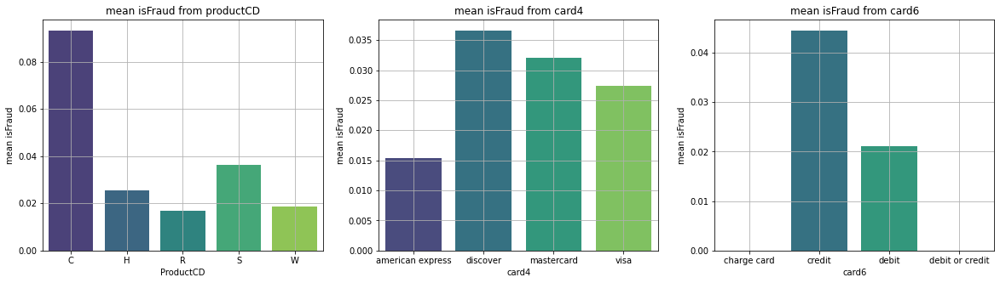

In [ ]:
fig = plt.figure(figsize=(20, 5))
plt.subplot(131)
sns.barplot(x=statistics_ProductCD.index, y=statistics_ProductCD.values, palette="viridis")
plt.title('mean isFraud from productCD')
plt.grid()
plt.ylabel('mean isFraud')
plt.subplot(132)
sns.barplot(x=statistics_card4.index, y=statistics_card4.values, palette="viridis")
plt.title('mean isFraud from card4')
plt.grid()
plt.ylabel('mean isFraud')
plt.subplot(133)
sns.barplot(x=statistics_card6.index, y=statistics_card6.values, palette="viridis")
plt.title('mean isFraud from card6')
plt.grid()
plt.ylabel('mean isFraud')
plt.show()

Вывод: значение С признака ProductCD значительно влияет на целевую переменную. Меньше всего мошеннических транзакций производится с картами "american express". Чаше мошеннические транзакции производятся с кредитными картами.